# Project : CNN 학습데이터 수집
### 제출일 : 2023.06.09

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")

import glob as gb
import cv2
import tensorflow as tf
import keras
import os

## 1. 데이터셋 카테고리 분류 기준

In [11]:
'''

## 데이터셋의 카테고리 분류 : 6가지

{'buildings' -> 0,
'forest' -> 1,
'glacier' -> 2,
'mountain' -> 3,
'sea' -> 4,
'street' -> 5 }

'''

"\nContext\nThis is image data of Natural Scenes around the world.\n\nContent\nThis Data contains around 25k images of size 150x150 distributed under 6 categories.\n{'buildings' -> 0,\n'forest' -> 1,\n'glacier' -> 2,\n'mountain' -> 3,\n'sea' -> 4,\n'street' -> 5 }\n\n"

## 2. 데이터셋 준비

### 2.1. 데이터셋별 이미지 저장 경로 지정

In [10]:
# 이미지를 분류별로 로컬에 저장
trainpath = 'data/seg_train/'
testpath = 'data/seg_test/'
predpath = 'data/seg_pred/'

### 2.2. training data 확인하기

In [12]:
for folder in  os.listdir(trainpath + 'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2191 in folder buildings
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier
For training data , found 2512 in folder mountain
For training data , found 2274 in folder sea
For training data , found 2382 in folder street


### 2.3. testing data 확인하기

In [13]:
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 437 in folder buildings
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier
For testing data , found 525 in folder mountain
For testing data , found 510 in folder sea
For testing data , found 501 in folder street


### 2.4. prediction data 확인하기

In [14]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


### 2.5. 데이터셋 dictionary 생성

In [15]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

### 2.6. training data 이미지 사이즈 확인

In [16]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(144, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(134, 150, 3)        2
(136, 150, 3)        2
(108, 150, 3)        2
(105, 150, 3)        1
(97, 150, 3)         1
(131, 150, 3)        1
(147, 150, 3)        1
(81, 150, 3)         1
(145, 150, 3)        1
(141, 150, 3)        1
(100, 150, 3)        1
(103, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(102, 150, 3)        1
(119, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(110, 150, 3)        1
(149, 150, 3)        1
(140, 150, 3)        1
dtype: int64

### 2.7. testing data 이미지 사이즈 확인

In [17]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(141, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(149, 150, 3)       1
(72, 150, 3)        1
(131, 150, 3)       1
(81, 150, 3)        1
dtype: int64

### 2.8. prediction data 이미지 사이즈 확인

In [18]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(133, 150, 3)       1
(139, 150, 3)       1
(108, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
(144, 150, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(129, 150, 3)       1
(100, 150, 3)       1
(112, 150, 3)       1
(126, 150, 3)       1
(374, 500, 3)       1
dtype: int64

## 3. training data 준비작업

### 3.1. 이미지 사이즈 100으로 통일로 training 시간 단축

In [19]:
s = 100

### 3.2. training data 확인 및 y값 지정

In [20]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])
        
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


### 3.3. training data randoom 확인

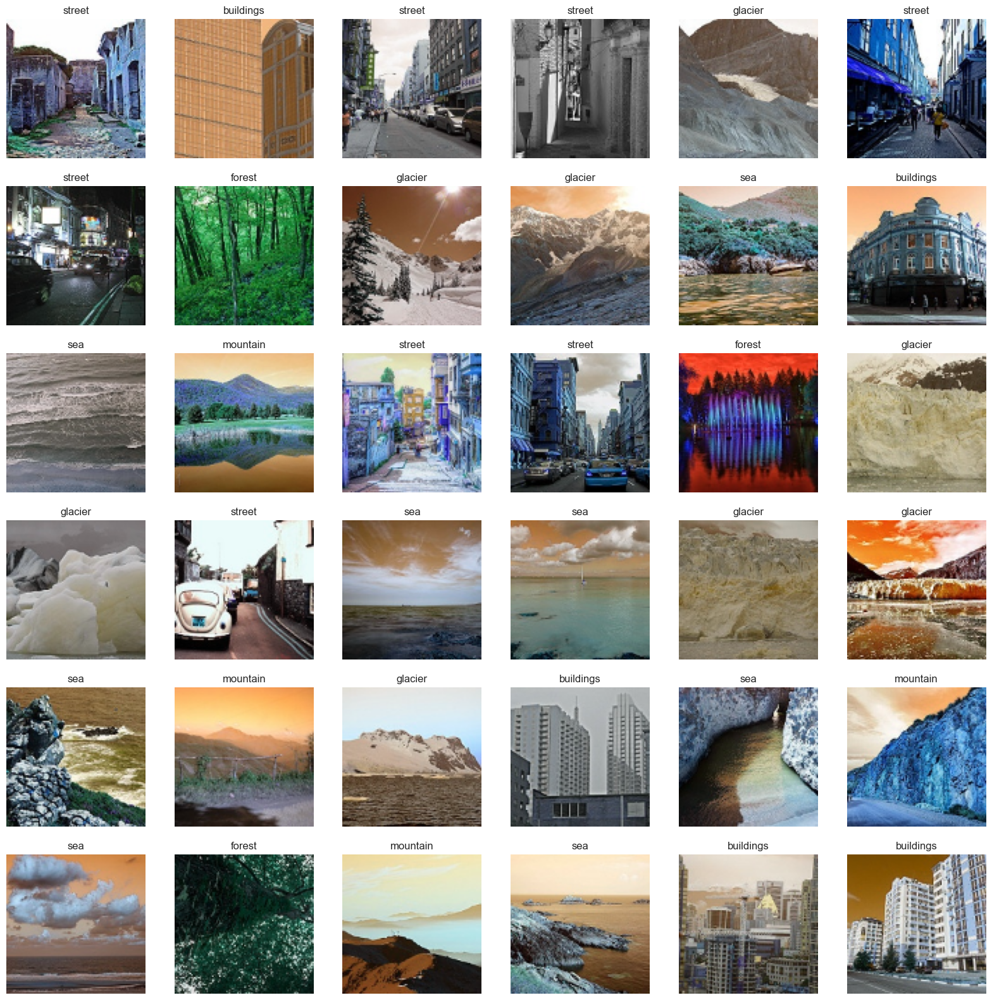

In [21]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

## 4. test data 준비작업

### 4.1. test data 확인 및 y값 지정

In [22]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])
        
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


### 4.2. test data randoom 확인

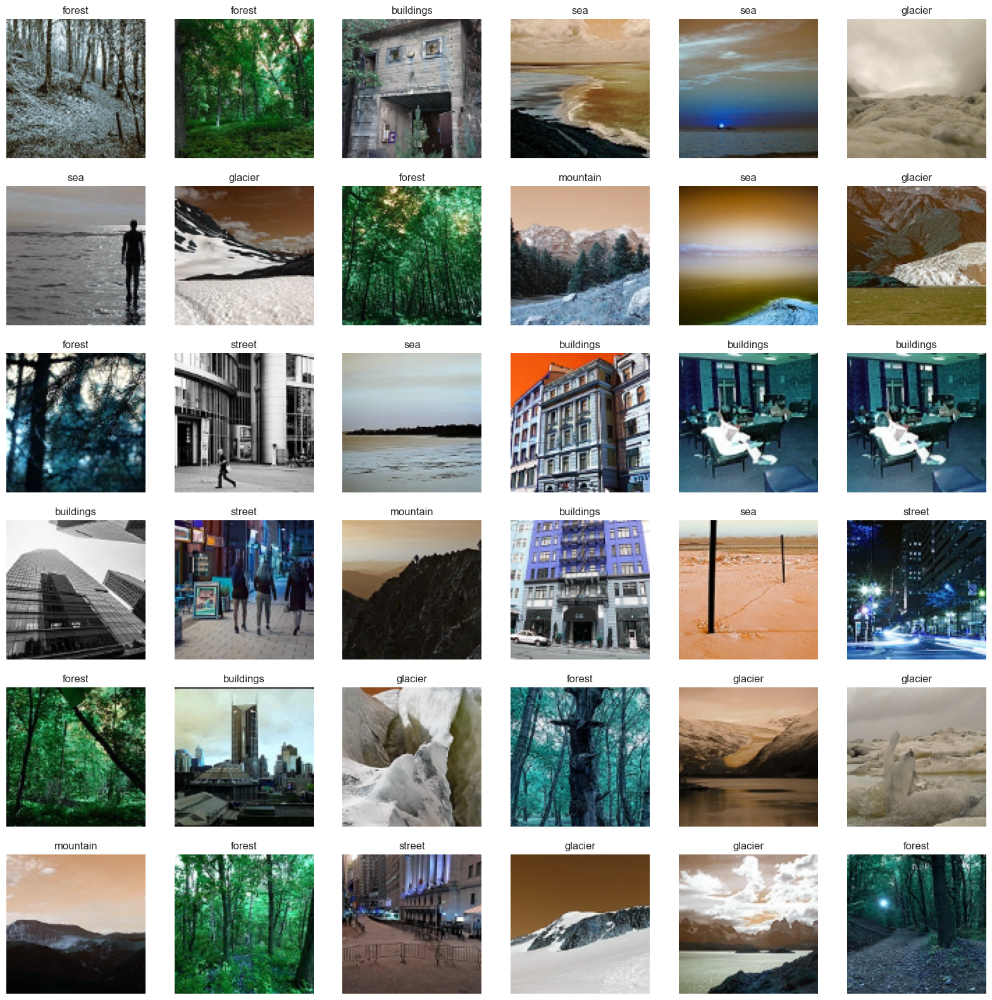

In [23]:
# also with Prediction data , without having title ofcourse

plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

## 5. prediction data 준비작업

### 5.1. prediction data 확인 및 y값 지정

In [24]:
# prediction data 수량 확인하기

X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))    
    
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


### 5.2. prediction data randoom 확인

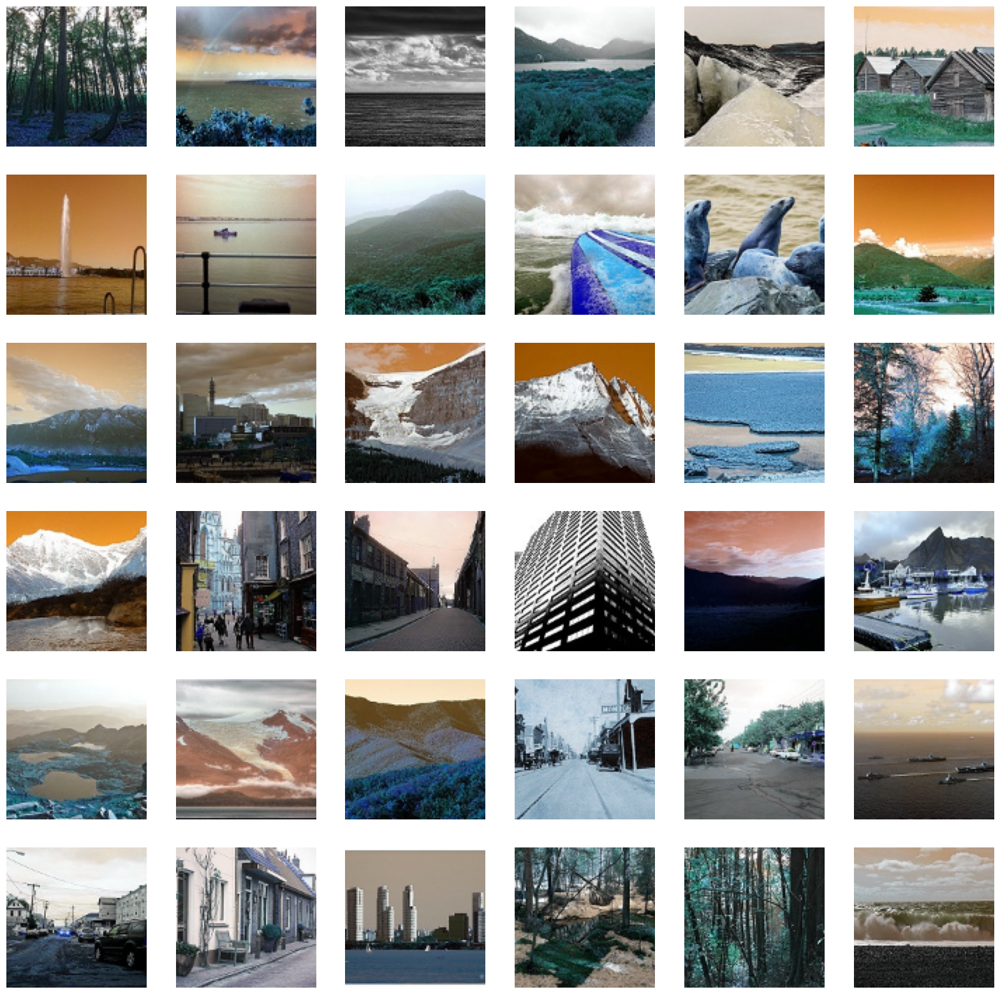

In [25]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

## 6. Building The Model

### 6.1. convert the data into arrays using numpy

In [26]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


### 6.2. build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

In [27]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

### 6.3. compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [28]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

### 6.4. print model details and summary KerasModel

In [29]:
# 모델의 형태 출력하기

print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                   

### 6.5. train the model

In [30]:
epochs = 50
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/50
220/220 [==============================] - 1145s 5s/step - loss: 1.7485 - accuracy: 0.3487
Epoch 2/50
220/220 [==============================] - 1085s 5s/step - loss: 1.1485 - accuracy: 0.5397
Epoch 3/50
220/220 [==============================] - 1017s 5s/step - loss: 1.0036 - accuracy: 0.6081
Epoch 4/50
220/220 [==============================] - 1018s 5s/step - loss: 0.8855 - accuracy: 0.6714
Epoch 5/50
220/220 [==============================] - 1013s 5s/step - loss: 0.8251 - accuracy: 0.6961
Epoch 6/50
220/220 [==============================] - 1012s 5s/step - loss: 0.7417 - accuracy: 0.7359
Epoch 7/50
220/220 [==============================] - 1014s 5s/step - loss: 0.6774 - accuracy: 0.7639
Epoch 8/50
220/220 [==============================] - 1011s 5s/step - loss: 0.6242 - accuracy: 0.7869
Epoch 9/50
220/220 [==============================] - 1012s 5s/step - loss: 0.5729 - accuracy: 0.8092
Epoch 10/50
220/220 [==============================] - 1013s 5s/step - loss: 0.526

### 6.6. check Loss & accuracy

In [32]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 58s 575ms/step - loss: 1.3753 - accuracy: 0.8157
Test Loss is 1.375311017036438
Test Accuracy is 0.815666675567627


### 6.7. predict X test

In [34]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 [==============================] - 54s 573ms/step
Prediction Shape is (3000, 6)


### 6.8. redict X Predict

In [35]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 [==============================] - 131s 574ms/step
Prediction Shape is (7301, 6)


### 6.9. show random redicted pictures & its predicting category

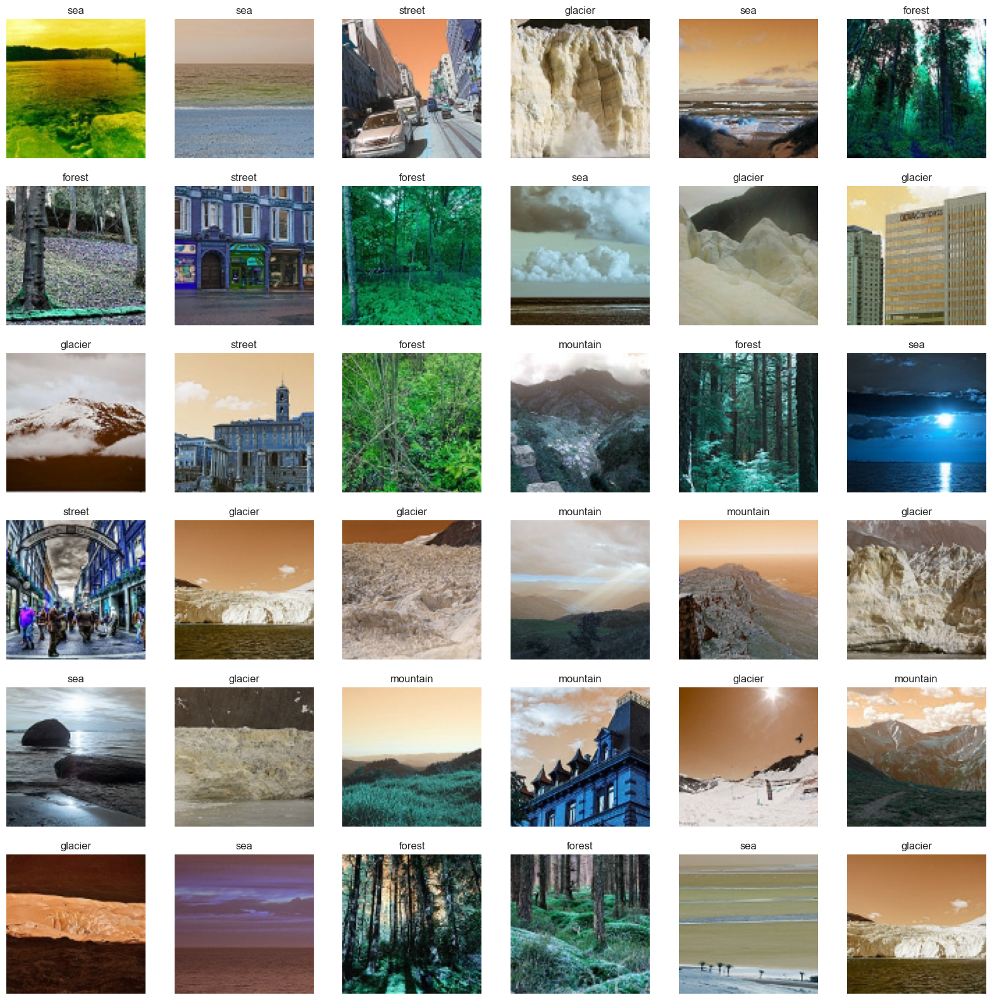

In [36]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))